In [9]:
import numpy as np
import tensorflow as tf

import cv2, os, glob, random, argparse, tqdm
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import imgaug.augmenters as iaa
import imgaug as ia

from tensorflow import keras
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.models import *
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, BatchNormalization, Activation, add, concatenate

# parsing args                                                                                                                                              
# parser = argparse.ArgumentParser(description= 'Unet_training')

In [10]:
ramdom_seed = 5198
input_h = 300
input_w = 300
input_c = 3
data_path = 'data_stomach'
batch_size = 16
file_save_name = 'save_model_stomach_Unet_5'
epochs = 200
validation_steps = 16
mse_w = 1
ssim_w = 100
lr = 0.0002
# random seed and gpu allow

physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    pass

tf.random.set_seed(ramdom_seed)
np.random.seed(ramdom_seed)
random.seed(ramdom_seed)
os.environ['PYTHONHASHSEED'] = str(ramdom_seed)

In [11]:
# loss 

def mse_dssim(y_true, y_pred):
    return mse_w * tf.losses.mean_squared_error(y_true, y_pred) + ssim_w *(1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val = 1)))

def res_block(x, nb_filters, strides):
    res_path = BatchNormalization()(x)
    res_path = Activation(activation='relu')(res_path)
    res_path = Conv2D(filters=nb_filters[0], kernel_size=(3, 3), padding='same', strides=strides[0])(res_path)
    res_path = BatchNormalization()(res_path)
    res_path = Activation(activation='relu')(res_path)
    res_path = Conv2D(filters=nb_filters[1], kernel_size=(3, 3), padding='same', strides=strides[1])(res_path)

    shortcut = Conv2D(nb_filters[1], kernel_size=(1, 1), strides=strides[0])(x)
    shortcut = BatchNormalization()(shortcut)

    res_path = add([shortcut, res_path])
    return res_path


def encoder(x):
    to_decoder = []

    main_path = Conv2D(filters=64, kernel_size=(3, 3), padding='same', strides=(1, 1))(x)
    main_path = BatchNormalization()(main_path)
    main_path = Activation(activation='relu')(main_path)

    main_path = Conv2D(filters=64, kernel_size=(3, 3), padding='same', strides=(1, 1))(main_path)

    shortcut = Conv2D(filters=64, kernel_size=(1, 1), strides=(1, 1))(x)
    shortcut = BatchNormalization()(shortcut)

    main_path = add([shortcut, main_path])
    # first branching to decoder
    to_decoder.append(main_path)

    main_path = res_block(main_path, [128, 128], [(2, 2), (1, 1)])
    to_decoder.append(main_path)

    main_path = res_block(main_path, [256, 256], [(2, 2), (1, 1)])
    to_decoder.append(main_path)

    return to_decoder


def decoder(x, from_encoder):
    main_path = UpSampling2D(size=(2, 2))(x)
    main_path = tf.keras.layers.experimental.preprocessing.Resizing(from_encoder[2].shape[1],from_encoder[2].shape[2])(main_path)
    main_path = concatenate([main_path, from_encoder[2]], axis=3)
    main_path = res_block(main_path, [256, 256], [(1, 1), (1, 1)])

    main_path = UpSampling2D(size=(2, 2))(main_path)
    main_path = concatenate([main_path, from_encoder[1]], axis=3)
    main_path = res_block(main_path, [128, 128], [(1, 1), (1, 1)])

    main_path = UpSampling2D(size=(2, 2))(main_path)
    main_path = concatenate([main_path, from_encoder[0]], axis=3)
    main_path = res_block(main_path, [64, 64], [(1, 1), (1, 1)])

    return main_path


def build_res_unet(input_shape):
    inputs = Input(shape=input_shape)

    to_decoder = encoder(inputs)

    path = res_block(to_decoder[2], [512, 512], [(2, 2), (1, 1)])

    path = decoder(path, from_encoder=to_decoder)

    path = Conv2D(filters=1, kernel_size=(1, 1), activation='sigmoid')(path)

    return Model(inputs=inputs, outputs=path)


model = build_res_unet((300, 300, 3))
model.compile(optimizer = keras.optimizers.Adam(lr = lr), loss = mse_dssim)


In [12]:
def load_seq_data(path):
    imgs = []
    labs = []
    frame_image_paths = sorted(glob.glob(path + '/*/trans3/*.png'))
    frame_depth_paths = sorted(glob.glob(path + '/*/depth/*.png'))
    # print(frame_image_paths)
    for i in tqdm.tqdm(range(len(frame_image_paths))):
        img = cv2.resize(cv2.cvtColor(cv2.imread(frame_image_paths[i]), cv2.COLOR_BGR2RGB), (300, 300))
        depth = cv2.resize(cv2.cvtColor(cv2.imread(frame_depth_paths[i]), cv2.COLOR_BGR2GRAY), (300, 300))
        imgs.append(img)
        labs.append(depth)
    return np.array(imgs), np.array(labs)


In [13]:
path = r'D:\DATA\ENDOSCOPY\00_vrcaps_recoding_data_simulation\20210624_delete\train'
train_data, train_lab = load_seq_data(path)
path = r'D:\DATA\ENDOSCOPY\00_vrcaps_recoding_data_simulation\20210624_delete\val'
val_data, val_lab = load_seq_data(path)


100%|██████████| 11854/11854 [02:36<00:00, 75.73it/s]
0it [00:00, ?it/s]


In [14]:
def image_aug_batch(img, label):
    # images = h w c
    # label bbox = (left, top, right, bottom)
    seq = iaa.Sequential([
    iaa.Multiply((0.9, 1.1)),
    iaa.Affine(
        translate_px={"x": 10, "y": 10},
        scale=(0.95, 1.05),
        rotate=(-180, 180)),
    iaa.Fliplr(0.5),
    iaa.Flipud(0.5)
    ])
    images_aug, labels_aug = seq(images = img.astype(np.float32)/255. ,heatmaps = label.astype(np.float32)/255.)
    return images_aug, labels_aug

def data_generator(train_imgs, train_labels, batch_size, aug = True):
    idx = 0
    while 1:
        idx_list = list(range(0,len(train_imgs)))
        random.shuffle(idx_list)
        if idx > len(idx_list) - batch_size:
            tmp_list = idx_list[idx:]
            idx = 0
        else:
            tmp_list = idx_list[idx:idx + batch_size]
            idx = idx + batch_size
        batch_images = train_imgs[tmp_list]
        batch_labels = train_labels[tmp_list]
        
        if aug == True:
            batch_images, batch_labels = image_aug_batch(batch_images, batch_labels)
        else:
            batch_images, batch_labels = batch_images / 255., batch_labels / 255.
        yield batch_images, batch_labels
        
train_gen = data_generator(train_data, train_lab[..., np.newaxis], batch_size, aug = True)
# test_gen = data_generator(test_x, test_y, batch_size, aug = False)
val_gen = data_generator(val_data, val_lab[..., np.newaxis], batch_size, aug = False)

In [15]:
print('steps :', int(len(train_data)/batch_size))
# print('val step epochs :', int(len(val_x)/batch_size))

try:
    if not os.path.exists(file_save_name):
        os.makedirs(file_save_name)
except OSError:
    print ('Error: Creating directory. ' +  file_save_name)
    
filepath = f'{file_save_name}' + '/model-{epoch:04d}.h5'
checkpoint = ModelCheckpoint(filepath, save_weights_only=True)

model_hist = model.fit(train_gen, validation_data= val_gen, validation_steps = int(len(val_data)/batch_size),  epochs = 100, steps_per_epoch =  int(len(train_data)/batch_size),callbacks = [checkpoint])

steps : 740
Epoch 1/100
740/740 [==============================] - 539s 711ms/step - loss: 5.0107
Epoch 2/100
740/740 [==============================] - 540s 717ms/step - loss: 2.8245
Epoch 3/100
740/740 [==============================] - 531s 717ms/step - loss: 2.4071
Epoch 4/100
740/740 [==============================] - 531s 717ms/step - loss: 2.2208
Epoch 5/100
740/740 [==============================] - 518s 700ms/step - loss: 2.0257
Epoch 6/100
740/740 [==============================] - 531s 718ms/step - loss: 1.8864
Epoch 7/100
740/740 [==============================] - 531s 718ms/step - loss: 1.7634
Epoch 8/100
740/740 [==============================] - 531s 717ms/step - loss: 1.5903
Epoch 9/100
740/740 [==============================] - 531s 718ms/step - loss: 1.4453
Epoch 10/100
740/740 [==============================] - 531s 718ms/step - loss: 1.3661
Epoch 11/100
740/740 [==============================] - 529s 714ms/step - loss: 1.3410
Epoch 12/100
740/740 [==================

KeyboardInterrupt: 

In [17]:
fig, loss_ax = plt.subplots(figsize =(15,5))

loss_ax.plot(model_hist.history['loss'], 'y', label='train loss')
loss_ax.plot(model_hist.history['val_loss'], 'r', label='val loss')
loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
loss_ax.legend(loc='upper left')
loss_ax.set_yscale('symlog')

plt.show()

NameError: name 'model_hist' is not defined

In [18]:
path_real = r'D:\DATA\ENDOSCOPY\yonsei\normal_crop'

In [19]:
def load_data(path):
    all_data = []
    data_list = glob.glob(path + '/*.png')[-50:]
    # print(data_list)
    for tmp in data_list: 
        img = cv2.imread(tmp)
        img = cv2.cvtColor(cv2.resize(img, (300,300)), cv2.COLOR_BGR2RGB)
        all_data.append(img)
    all_data = np.array(all_data)/255.
    return all_data

In [20]:
all_img = load_data(path_real)
predict_imgs = model.predict(all_img)

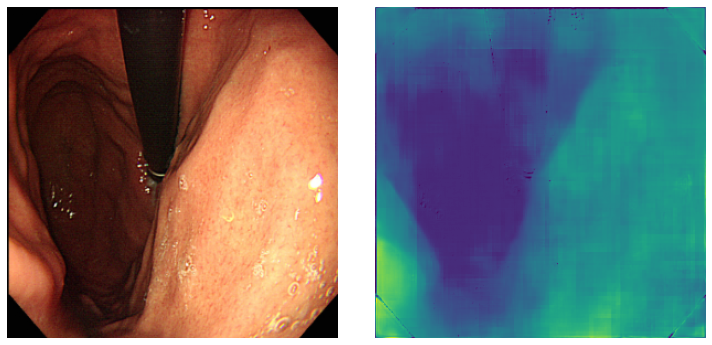

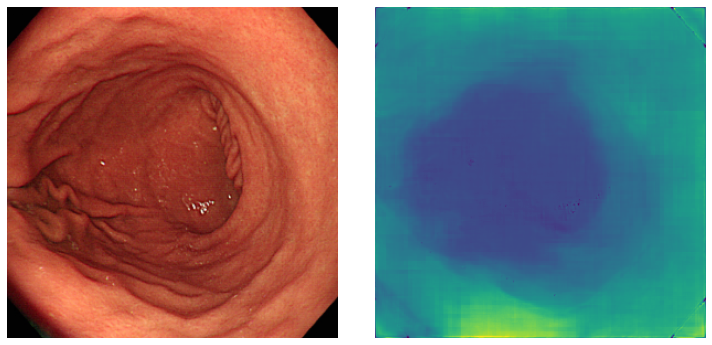

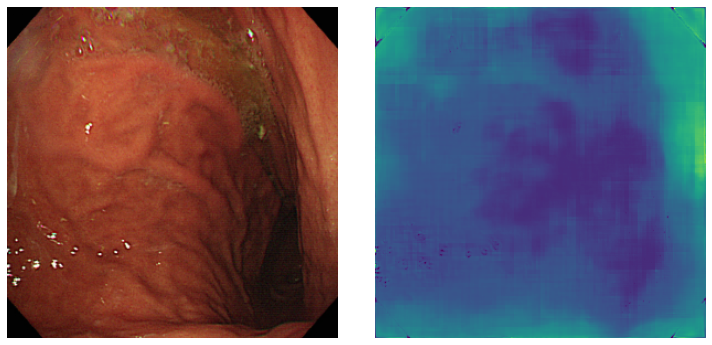

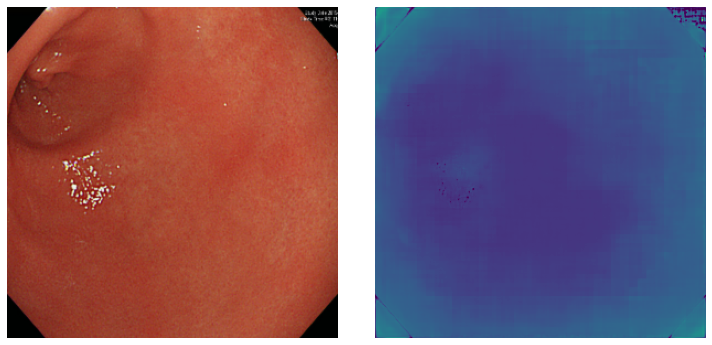

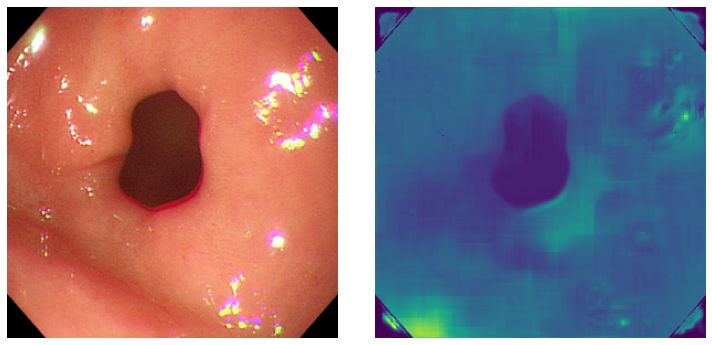

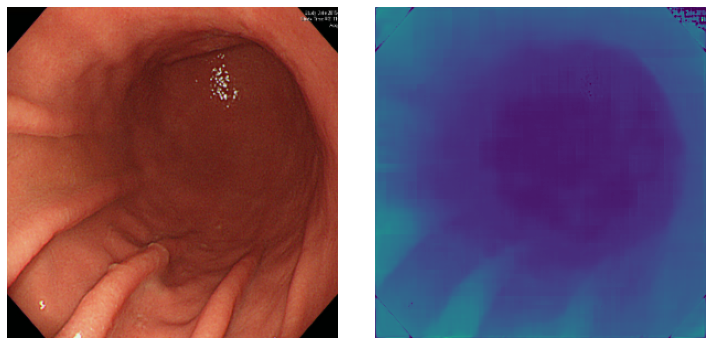

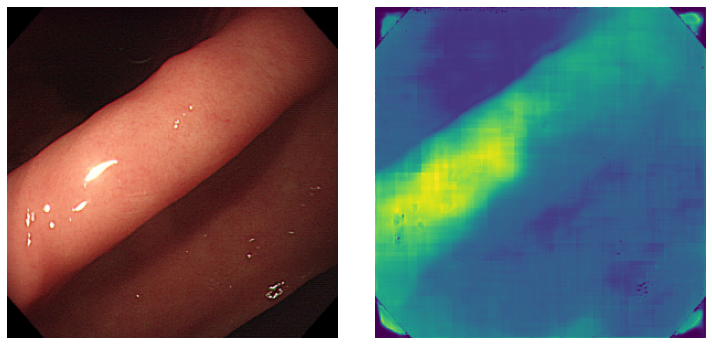

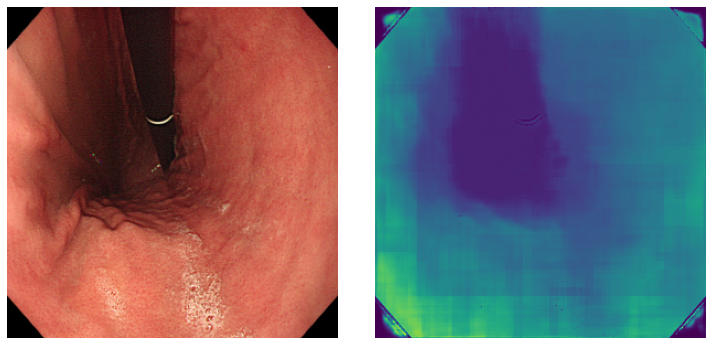

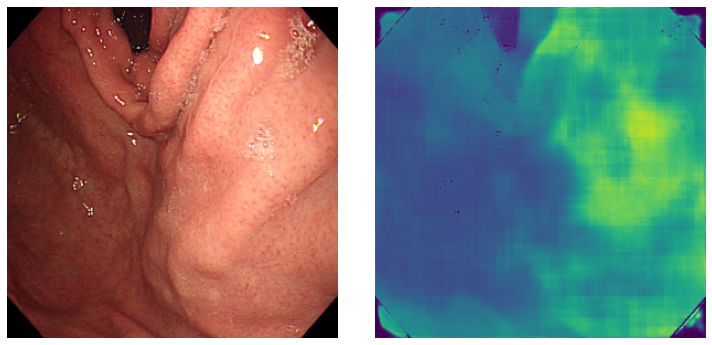

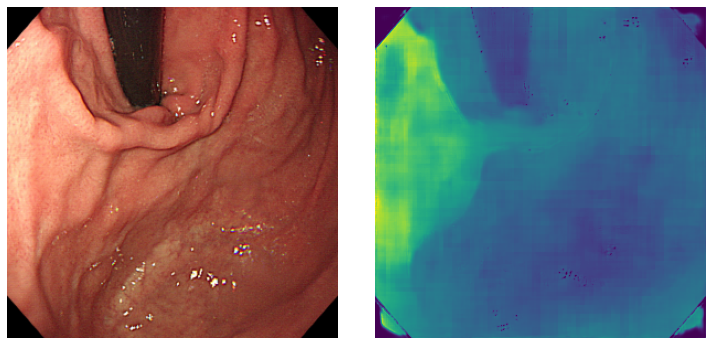

In [21]:
for i in range(30,40):
    plt.figure(figsize=(10, 10))
    plt.subplot(121)
    plt.imshow(all_img[i])
    plt.tight_layout()
    plt.axis('off')
    plt.subplot(122)
    plt.imshow(predict_imgs[i,...,0])
    plt.tight_layout()
    plt.axis('off')

    plt.show()

In [5]:
test_x = np.load(os.path.join('data_sim', 'eval.npy'))
test_y = np.load(os.path.join('data', 'test_y.npy'))

In [6]:
predict_imgs = model.predict(test_x/255.)

In [7]:
def img_decode(batch_images):
    batch_images = (batch_images * 255).astype(np.uint8)
    return np.clip(batch_images, 0, 255)

In [8]:
cm = plt.get_cmap('magma')

for i in range(len(predict_imgs)):
    colored_image = cm(predict_imgs[i,...,0])
    colored_image = img_decode(colored_image[...,:3])
    cv2.imwrite(os.path.join('00_inference/simulation',f'{i:04d}.png'), cv2.cvtColor(colored_image, cv2.COLOR_BGR2RGB))

In [10]:
test_x = np.load(os.path.join('data_sim', 'eval_x.npy'))
predict_imgs = model.predict(test_x/255.)

cm = plt.get_cmap('magma')

for i in range(len(predict_imgs)):
    colored_image = cm(predict_imgs[i,...,0])
    colored_image = img_decode(colored_image[...,:3])
    cv2.imwrite(os.path.join('00_inference_real/simulation',f'{i:04d}.png'), cv2.cvtColor(colored_image, cv2.COLOR_BGR2RGB))

In [5]:
data_path = '../cyclegan_stomach/images/B/'

In [28]:
def load_data(path):
    all_data = []
    data_list = glob.glob(path + '/*.png')
    for tmp in data_list: 
        img = cv2.imread(tmp)
        img = cv2.cvtColor(cv2.resize(img, (256,256)), cv2.COLOR_BGR2RGB)
        all_data.append(img)
    all_data = np.array(all_data)/255.
    return all_data

In [33]:
all_img = load_data(data_path)

In [39]:
model.load_weights('save_model/model-0100.h5')

In [40]:
predict_imgs = model.predict(all_img)

In [42]:
random.randint(0, 3000)

9

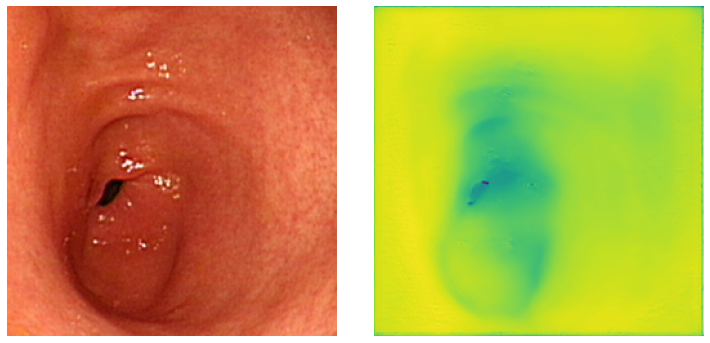

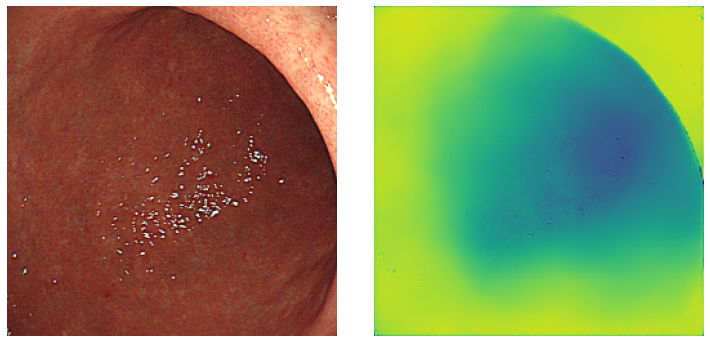

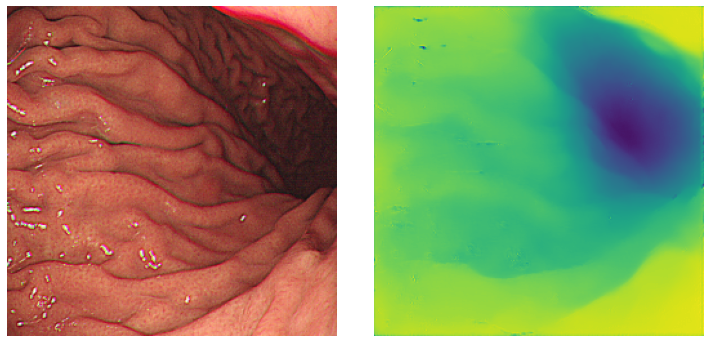

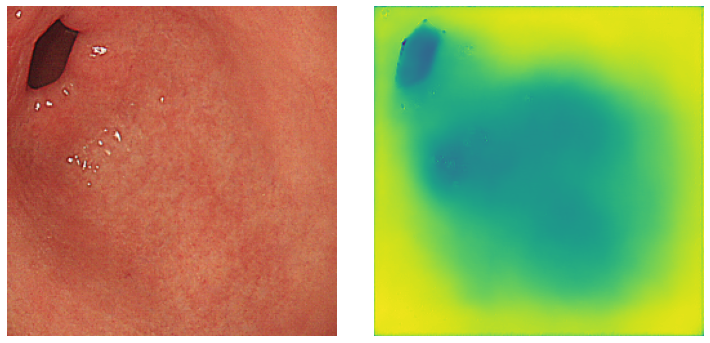

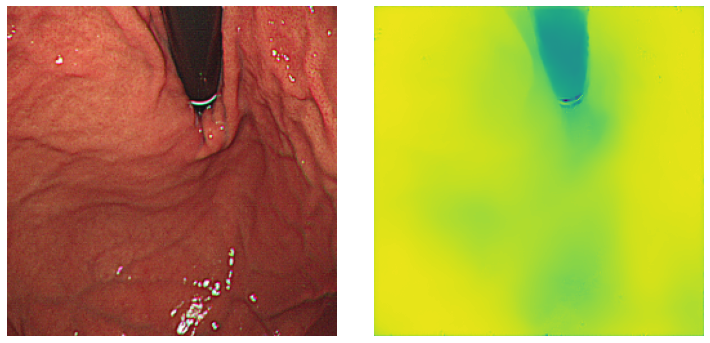

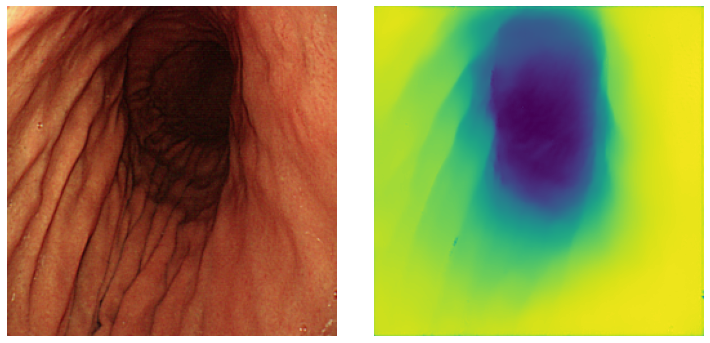

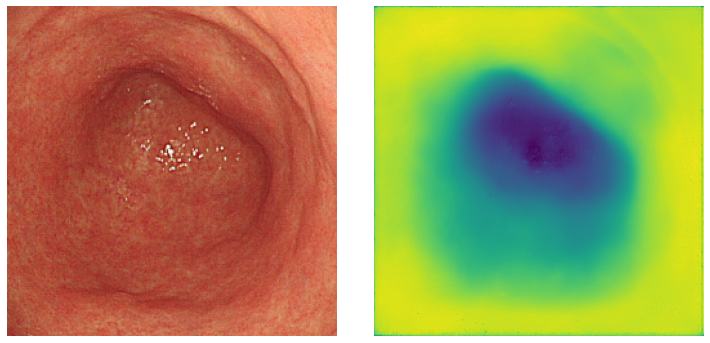

In [47]:
for i in range(7):
    i = random.randint(0, 1030)
    plt.figure(figsize=(10, 10))
    plt.subplot(121)
    plt.imshow(all_img[i])
    plt.tight_layout()
    plt.axis('off')
    plt.subplot(122)
    plt.imshow(predict_imgs[i,...,0])
    plt.tight_layout()
    plt.axis('off')

    plt.show()